In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 5.7 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as f
import torch.optim as optim
import torchmetrics as tm
import torch.cuda.amp as amp
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm.autonotebook as tqdm
import copy
import random

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def set_seed(seed: int) -> None:
    """
    set random seed for modules :)
    :param seed: random seed
    """
    torch.manual_seed(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.cuda.manual_seed(seed)
set_seed(0)

In [ ]:
data=pd.read_csv("/content/drive/MyDrive/Ali/final project/000001.SS.csv")
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2004-01-02,1492.723999,1526.244019,1491.693970,1517.192993,1517.192993,16600.0
1,2004-01-05,1516.796997,1568.814941,1516.697021,1568.353027,1568.353027,28600.0
2,2004-01-06,1568.899048,1589.083008,1557.927002,1574.522949,1574.522949,32600.0
3,2004-01-07,1574.102051,1594.996948,1565.087036,1587.203979,1587.203979,30600.0
4,2004-01-08,1587.451050,1616.576050,1582.880005,1610.125977,1610.125977,28400.0
...,...,...,...,...,...,...,...
3436,2017-12-25,3296.210938,3312.300049,3270.440918,3280.839111,3280.839111,142500.0
3437,2017-12-26,3277.836914,3307.299072,3274.326904,3306.125000,3306.125000,142400.0
3438,2017-12-27,3302.460938,3307.080078,3270.349121,3275.782959,3275.782959,162700.0
3439,2017-12-28,3272.291016,3304.095947,3263.728027,3296.385010,3296.385010,175400.0


In [ ]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3400.000000,3400.000000,3400.000000,3400.000000,3400.000000,3400.000000
mean,2600.437964,2626.096274,2573.727813,2603.369028,2603.369028,122357.500000
std,940.299585,952.663496,924.668684,940.865359,940.865359,115346.792392
min,1007.901001,1019.921997,998.228027,1011.499023,1011.499023,3600.000000
25%,2026.598236,2044.816955,2016.551025,2030.497711,2030.497711,52800.000000
50%,2529.345947,2559.789917,2507.456054,2535.941894,2535.941894,95200.000000
75%,3129.728394,3150.640076,3104.885192,3132.697815,3132.697815,153125.000000
max,6057.428223,6124.043945,6040.712891,6092.057129,6092.057129,857100.000000


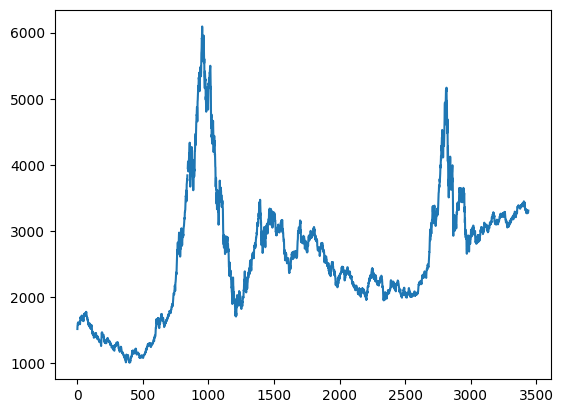

In [ ]:
time=data.index.values
plt.plot(time,data["Close"]);

In [ ]:
data["Close"].isna().sum()
data["Close"].fillna(method="ffill",inplace=True)# filling with forward data
data["Close"].isna().sum()

0

In [ ]:
signal=data["Close"].values
n_train = int(0.8*signal.shape[0])

# data without use EMD
train_data = signal[:n_train]
test_data = signal[n_train:]

In [ ]:
min_max_scaler = StandardScaler()
min_max_scaler.fit(train_data.reshape(-1, 1))
train_data = min_max_scaler.transform(train_data.reshape(-1, 1))
test_data = min_max_scaler.transform(test_data.reshape(-1, 1))
train_data = train_data.ravel()
test_data = test_data.ravel()

In [ ]:
def convertToDataset(data, step):
    X, Y =[], []
    for i in range(len(data)-step):
        d=i+step
        X.append(data[i:d,])
        Y.append(data[d,])
    return np.array(X), np.array(Y)

In [ ]:
class CSVDataset(Dataset):
    def __init__(self, data, num_sqn=20):
        self.data = data
        self.num_sqn = num_sqn
        self.x , self.y = convertToDataset(self.data , self.num_sqn)
        self.x = torch.tensor(self.x, dtype=torch.float32)
        self.y = torch.tensor(self.y, dtype=torch.float32)

    def __getitem__(self, idx):
        x, y = self.x[idx], self.y[idx]
        return x, y

    def __len__(self):
        return len(self.x)

In [ ]:
train_ds = CSVDataset(train_data)
test_ds = CSVDataset(test_data)

In [ ]:
train_ds[0][0].shape

torch.Size([20])

In [ ]:
t = torch.cat([train_ds.x, train_ds.y.reshape(-1, 1)], dim=-1)

<Axes: >

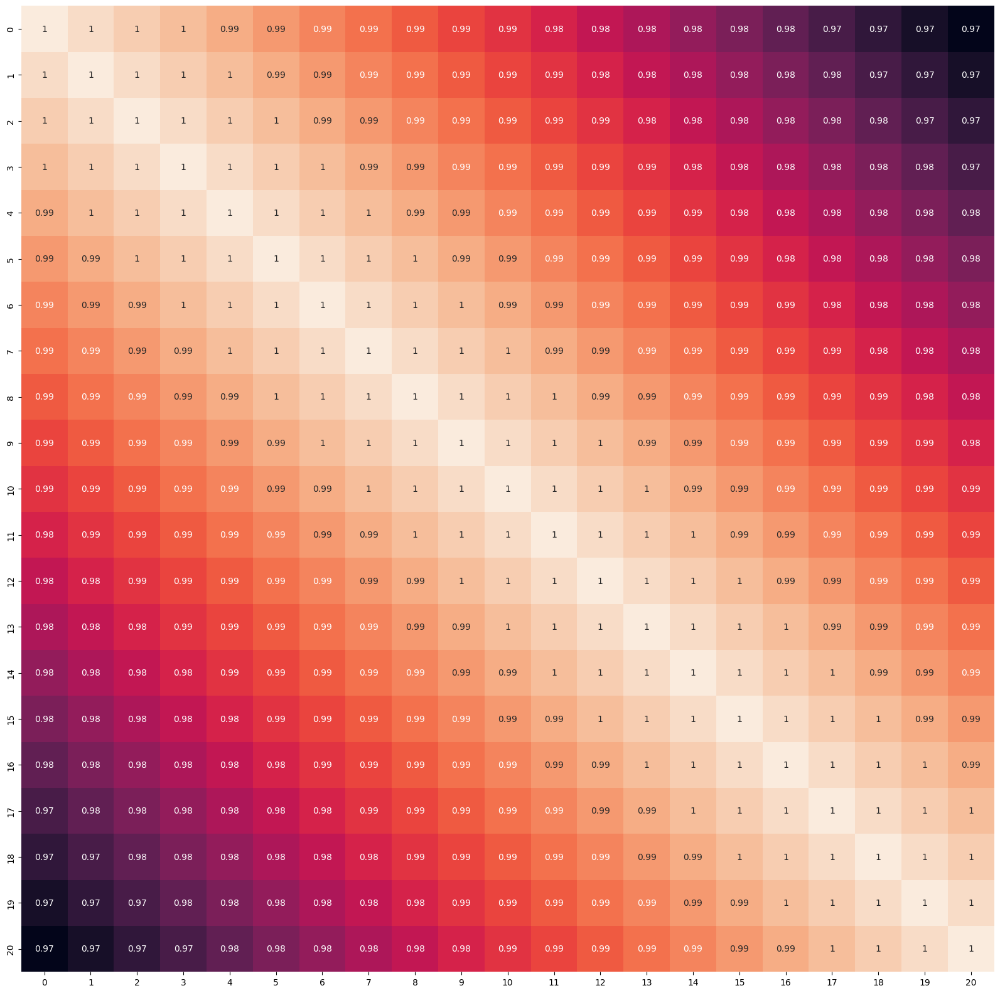

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(pd.DataFrame(t.numpy(), columns=list(range(21))).corr(), annot=True, cbar=False)

In [ ]:
train_size = int(0.9 * len(train_ds))
test_size = len(train_ds) - train_size


In [ ]:
len(train_ds), len(test_ds)

(2732, 669)

In [ ]:
BATCH_SIZE = 16
NW = 4

In [ ]:
train_dl = DataLoader(train_ds, shuffle=True, batch_size=BATCH_SIZE, pin_memory=True)
test_dl = DataLoader(test_ds, shuffle=False, batch_size=BATCH_SIZE, pin_memory=True)
dataloaders = {
    "train": train_dl,
    "test": test_dl
}

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [ ]:
class MlpModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.layer = nn.Sequential(
            self.get_linear(20, 64),
            nn.Linear(64, 1),
        )

    def forward(self, x):
        return self.layer(x).reshape(-1)

    def get_linear(self, indim , outdim):
        return nn.Sequential(
            nn.Linear(indim, outdim),
            nn.ReLU(),
        )


In [ ]:
class LSTMLayer(nn.Module):
    def __init__(self, in_size, hi_size):
        super().__init__()
        self.lstm = nn.LSTMCell(in_size, hi_size, device=device)
        self.hi_size = hi_size


    def forward(self, x):
        output = []
        x = x.unsqueeze(-1)
        hx = torch.zeros(x.shape[0], self.hi_size).to(device)
        cx = torch.zeros(x.shape[0], self.hi_size).to(device)
        for i in range(x.shape[1]):
            hx, cx = self.lstm(x[:, i, :], (hx, cx))
            output.append(hx)
        return torch.stack(output, dim=1)


In [ ]:
class LSTMModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(64, 1),
        )
        self.lstm = LSTMLayer(1, 64)

    def forward(self, x):
        h = self.lstm(x)
        return self.mlp(h[:, -1, :]).reshape(-1)

    def get_linear(self, indim , outdim):
        return nn.Sequential(
            nn.Linear(indim, outdim),
            nn.ReLU(),
        )



In [ ]:
class Attention(nn.Module):
    def __init__(self, hidden_size):
        super().__init__()
        self.Va = nn.Linear(hidden_size, 1)

    def forward(self, x):
        scores = self.Va(x)
        scores = scores.squeeze(2).unsqueeze(1)

        weights = f.softmax(scores, dim=-1)
        context = torch.bmm(weights, x).squeeze(1)
        return context, weights

In [ ]:
class AttnLSTM(nn.Module):
    def __init__(self, ):
        super().__init__()
        self.attention = Attention(64)
        self.lstm = LSTMLayer(1, 64)
        self.mlp = nn.Sequential(
            nn.Linear(64, 1),
        )
        self.attn_weights = None

    def get_linear(self, indim , outdim):
        return nn.Sequential(
            nn.Linear(indim, outdim),
            nn.ReLU(),
        )

    def forward(self, x):
        h = self.lstm(x)
        y, w = self.attention(h)
        self.attn_weights = w

        return self.mlp(y).reshape(-1)



In [ ]:
# lstm = AttnLSTM()
# lstm = lstm.to(device)
# criterion = nn.L1Loss()
# a, b = next(iter(train_dl))
# output = lstm(a.to(device))
# # print(a.shape, b.shape)
# # c = lstm(a)
# # print(c.shape)
# print(criterion(output, b.to(device)))


In [ ]:
# lstm.attention.Va

In [ ]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
class Trainer:
    def __init__(self, dataloaders, model, criterion, optimizer, scheduler, model_name="model", num_epochs=25):
        self.model = model.to(device)
        self.criterion = criterion
        self.optimizer = optimizer
        self.scheduler = scheduler
        self.num_epochs = num_epochs
        self.model_name = model_name
        self.dataloaders = dataloaders
        self.scaler = amp.GradScaler()

        self.metric_train = tm.regression.MeanAbsoluteError().to(device)
        self.loss_train = AverageMeter()
        self.train_hist = []

        self.metric_valid = tm.regression.MeanAbsoluteError().to(device)
        self.loss_valid = AverageMeter()
        self.valid_hist = []

        self.best_acc = torch.inf

    def one_step(self, inputs, targets):
        training = self.model.training
        with amp.autocast(enabled=training):
            inputs = inputs.to(device)
            targets = targets.to(device)
            outputs = self.model(inputs)
            loss = self.criterion(input=outputs, target=targets)
        if training:
            self.scaler.scale(loss).backward()
            self.scaler.step(self.optimizer)
            self.scaler.update()
            self.optimizer.zero_grad()
            self.metric_train.update(outputs, targets)
            self.loss_train.update(loss)

        else:
            self.metric_valid.update(outputs, targets)
            self.loss_valid.update(loss)
        return loss

    def train_one_epoch(self, epoch):
        self.model.train()
        self.loss_train.reset()
        self.metric_train.reset()
        with tqdm.tqdm(self.dataloaders["train"], unit='batch') as tepoch:
            for inputs, targets in tepoch:
                self.one_step(inputs, targets)
                tepoch.set_postfix(loss=self.loss_train.avg.item(), metric=self.metric_train.compute().item(), phase="Training")
            if self.scheduler is not None:
                self.scheduler.step()
        return self.loss_train.avg, self.metric_train.compute().item()

    def valid_one_epoch(self, epoch):
        self.model.eval()
        self.loss_valid.reset()
        self.metric_valid.reset()
        with tqdm.tqdm(self.dataloaders["test"], unit='batch') as tepoch:
            with torch.inference_mode():
                for inputs, targets in tepoch:
                    self.one_step(inputs, targets)
                    tepoch.set_postfix(loss=self.loss_valid.avg.item(), metric=self.metric_valid.compute().item(),
                                       phase="Validation")

        return self.loss_valid.avg.item(), self.metric_valid.compute().item()

    def train(self):
        for epoch in range(self.num_epochs):
            set_seed(epoch)
            t_loss, t_acc = self.train_one_epoch(epoch)
            v_loss, v_acc = self.valid_one_epoch(epoch)
            self.train_hist.append(t_acc)
            self.valid_hist.append(v_acc)
            print(f"Epoch: {epoch}, Train Loss: {t_loss:.4}, Train Acc: {t_acc:.4}, Valid Loss: {v_loss:.4}, Valid Acc: {v_acc:.4}")


            if v_acc < self.best_acc:
                state = {
                    "model": self.model.state_dict(),
                    "optimizer": self.optimizer.state_dict(),
                    "epoch": epoch,
                    "acc": self.best_acc,
                    "scaler": scaler.state_dict()
                }
                torch.save(state, f'{self.model_name}.pth')
                self.best_acc = v_acc
                self.best_model = copy.deepcopy(self.model)
                print('Model Saved!')
            print()

    def valid(self):
        v_loss, v_acc = self.valid_one_epoch(0)
        print(f"Validation: : Valid Loss: {v_loss:.4}, Valid Acc: {v_acc:.4}")

    def overfit(self):
        self.model.train()
        inputs, targets = next(iter(self.dataloaders["train"]))
        for epoch in range(100):
            loss = self.one_step(inputs, targets)
            print(f"Epoch: {epoch}, Loss: {loss}")

    def test(self, tensor):
      tensor = tensor.to(device)
      self.best_model.eval()
      # if hasattr(self.best_model, "lstm"):
      #     self.best_model.flatten_parameters()
      with torch.inference_mode():
        out = self.best_model(tensor)
      return out

In [ ]:
criterion = nn.L1Loss()
mlp_model = MlpModel()
optimizer = optim.SGD(params=mlp_model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-5)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200, eta_min=1e-5)
scaler = amp.GradScaler()
trainer_mlp = Trainer(dataloaders, mlp_model, criterion, optimizer, scheduler=scheduler, num_epochs=200, model_name="mlp")
trainer_mlp.train()

  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 0, Train Loss: 0.1033, Train Acc: 0.1034, Valid Loss: 0.05832, Valid Acc: 0.05845
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 1, Train Loss: 0.06352, Train Acc: 0.06354, Valid Loss: 0.06061, Valid Acc: 0.06069



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 2, Train Loss: 0.06385, Train Acc: 0.06384, Valid Loss: 0.1108, Valid Acc: 0.1108



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 3, Train Loss: 0.07183, Train Acc: 0.07189, Valid Loss: 0.06843, Valid Acc: 0.0685



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 4, Train Loss: 0.06522, Train Acc: 0.06527, Valid Loss: 0.052, Valid Acc: 0.0521
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 5, Train Loss: 0.05274, Train Acc: 0.05274, Valid Loss: 0.1123, Valid Acc: 0.1123



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 6, Train Loss: 0.05514, Train Acc: 0.05511, Valid Loss: 0.05959, Valid Acc: 0.05965



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 7, Train Loss: 0.04976, Train Acc: 0.04972, Valid Loss: 0.1015, Valid Acc: 0.1015



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 8, Train Loss: 0.05493, Train Acc: 0.05494, Valid Loss: 0.06212, Valid Acc: 0.06215



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 9, Train Loss: 0.05874, Train Acc: 0.05877, Valid Loss: 0.04131, Valid Acc: 0.04142
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 10, Train Loss: 0.05663, Train Acc: 0.05668, Valid Loss: 0.05803, Valid Acc: 0.05812



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 11, Train Loss: 0.05102, Train Acc: 0.051, Valid Loss: 0.09631, Valid Acc: 0.09638



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 12, Train Loss: 0.05552, Train Acc: 0.05552, Valid Loss: 0.04225, Valid Acc: 0.04237



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 13, Train Loss: 0.0588, Train Acc: 0.05882, Valid Loss: 0.0457, Valid Acc: 0.0458



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 14, Train Loss: 0.05438, Train Acc: 0.05437, Valid Loss: 0.1477, Valid Acc: 0.1477



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 15, Train Loss: 0.04861, Train Acc: 0.04864, Valid Loss: 0.112, Valid Acc: 0.1121



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 16, Train Loss: 0.05153, Train Acc: 0.05154, Valid Loss: 0.08513, Valid Acc: 0.08514



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 17, Train Loss: 0.05041, Train Acc: 0.05039, Valid Loss: 0.1314, Valid Acc: 0.1314



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 18, Train Loss: 0.05857, Train Acc: 0.05856, Valid Loss: 0.05736, Valid Acc: 0.05744



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 19, Train Loss: 0.04995, Train Acc: 0.04997, Valid Loss: 0.03987, Valid Acc: 0.03998
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 20, Train Loss: 0.05303, Train Acc: 0.05299, Valid Loss: 0.1157, Valid Acc: 0.1156



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 21, Train Loss: 0.05761, Train Acc: 0.05758, Valid Loss: 0.09757, Valid Acc: 0.09758



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 22, Train Loss: 0.05351, Train Acc: 0.0535, Valid Loss: 0.1055, Valid Acc: 0.1055



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 23, Train Loss: 0.05489, Train Acc: 0.05491, Valid Loss: 0.07459, Valid Acc: 0.07467



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 24, Train Loss: 0.05649, Train Acc: 0.05654, Valid Loss: 0.03894, Valid Acc: 0.03904
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 25, Train Loss: 0.04976, Train Acc: 0.04973, Valid Loss: 0.1275, Valid Acc: 0.1275



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 26, Train Loss: 0.0502, Train Acc: 0.05022, Valid Loss: 0.04199, Valid Acc: 0.04208



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 27, Train Loss: 0.04992, Train Acc: 0.04982, Valid Loss: 0.1101, Valid Acc: 0.1102



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 28, Train Loss: 0.04629, Train Acc: 0.04619, Valid Loss: 0.06237, Valid Acc: 0.06244



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 29, Train Loss: 0.06112, Train Acc: 0.06114, Valid Loss: 0.07584, Valid Acc: 0.07587



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 30, Train Loss: 0.05301, Train Acc: 0.05302, Valid Loss: 0.1064, Valid Acc: 0.1064



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 31, Train Loss: 0.04833, Train Acc: 0.04836, Valid Loss: 0.05745, Valid Acc: 0.05749



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 32, Train Loss: 0.0593, Train Acc: 0.05928, Valid Loss: 0.0594, Valid Acc: 0.05946



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 33, Train Loss: 0.06069, Train Acc: 0.0606, Valid Loss: 0.1417, Valid Acc: 0.1417



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 34, Train Loss: 0.05806, Train Acc: 0.05807, Valid Loss: 0.04166, Valid Acc: 0.04174



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 35, Train Loss: 0.04576, Train Acc: 0.04574, Valid Loss: 0.04203, Valid Acc: 0.0421



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 36, Train Loss: 0.05171, Train Acc: 0.05174, Valid Loss: 0.04677, Valid Acc: 0.04689



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 37, Train Loss: 0.04342, Train Acc: 0.0434, Valid Loss: 0.04224, Valid Acc: 0.04236



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 38, Train Loss: 0.04607, Train Acc: 0.04607, Valid Loss: 0.06997, Valid Acc: 0.07004



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 39, Train Loss: 0.04964, Train Acc: 0.04968, Valid Loss: 0.04314, Valid Acc: 0.04322



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 40, Train Loss: 0.0585, Train Acc: 0.0585, Valid Loss: 0.09855, Valid Acc: 0.09856



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 41, Train Loss: 0.05315, Train Acc: 0.05314, Valid Loss: 0.06345, Valid Acc: 0.06348



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 42, Train Loss: 0.06097, Train Acc: 0.06098, Valid Loss: 0.06558, Valid Acc: 0.06561



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 43, Train Loss: 0.0591, Train Acc: 0.05905, Valid Loss: 0.06516, Valid Acc: 0.06526



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 44, Train Loss: 0.04749, Train Acc: 0.0475, Valid Loss: 0.05888, Valid Acc: 0.05894



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 45, Train Loss: 0.04486, Train Acc: 0.04487, Valid Loss: 0.03861, Valid Acc: 0.03871
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 46, Train Loss: 0.05323, Train Acc: 0.05324, Valid Loss: 0.03876, Valid Acc: 0.03886



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 47, Train Loss: 0.04992, Train Acc: 0.04993, Valid Loss: 0.04096, Valid Acc: 0.04103



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 48, Train Loss: 0.04721, Train Acc: 0.04722, Valid Loss: 0.05101, Valid Acc: 0.05107



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 49, Train Loss: 0.04883, Train Acc: 0.04884, Valid Loss: 0.04327, Valid Acc: 0.04338



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 50, Train Loss: 0.0483, Train Acc: 0.04824, Valid Loss: 0.1448, Valid Acc: 0.1448



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 51, Train Loss: 0.05254, Train Acc: 0.05251, Valid Loss: 0.05331, Valid Acc: 0.05337



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 52, Train Loss: 0.0458, Train Acc: 0.04582, Valid Loss: 0.04416, Valid Acc: 0.04426



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 53, Train Loss: 0.04521, Train Acc: 0.0452, Valid Loss: 0.07911, Valid Acc: 0.07915



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 54, Train Loss: 0.05388, Train Acc: 0.0539, Valid Loss: 0.08372, Valid Acc: 0.08376



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 55, Train Loss: 0.04427, Train Acc: 0.0443, Valid Loss: 0.04712, Valid Acc: 0.0472



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 56, Train Loss: 0.04438, Train Acc: 0.04439, Valid Loss: 0.08901, Valid Acc: 0.08909



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 57, Train Loss: 0.05184, Train Acc: 0.05188, Valid Loss: 0.03947, Valid Acc: 0.03957



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 58, Train Loss: 0.04433, Train Acc: 0.04432, Valid Loss: 0.0396, Valid Acc: 0.03969



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 59, Train Loss: 0.04498, Train Acc: 0.04498, Valid Loss: 0.0537, Valid Acc: 0.0538



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 60, Train Loss: 0.04599, Train Acc: 0.04599, Valid Loss: 0.0481, Valid Acc: 0.04817



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 61, Train Loss: 0.05007, Train Acc: 0.05007, Valid Loss: 0.03898, Valid Acc: 0.03907



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 62, Train Loss: 0.05422, Train Acc: 0.05418, Valid Loss: 0.04082, Valid Acc: 0.04088



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 63, Train Loss: 0.04867, Train Acc: 0.04873, Valid Loss: 0.04163, Valid Acc: 0.04173



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 64, Train Loss: 0.04054, Train Acc: 0.04058, Valid Loss: 0.03781, Valid Acc: 0.0379
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 65, Train Loss: 0.04863, Train Acc: 0.04856, Valid Loss: 0.1259, Valid Acc: 0.1259



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 66, Train Loss: 0.04748, Train Acc: 0.04733, Valid Loss: 0.04075, Valid Acc: 0.04085



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 67, Train Loss: 0.05458, Train Acc: 0.0546, Valid Loss: 0.1055, Valid Acc: 0.1056



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 68, Train Loss: 0.04883, Train Acc: 0.04884, Valid Loss: 0.07084, Valid Acc: 0.07086



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 69, Train Loss: 0.04548, Train Acc: 0.04547, Valid Loss: 0.0559, Valid Acc: 0.05595



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 70, Train Loss: 0.04633, Train Acc: 0.04634, Valid Loss: 0.05082, Valid Acc: 0.0509



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 71, Train Loss: 0.04613, Train Acc: 0.04609, Valid Loss: 0.1028, Valid Acc: 0.1029



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 72, Train Loss: 0.05237, Train Acc: 0.05227, Valid Loss: 0.1297, Valid Acc: 0.1297



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 73, Train Loss: 0.04618, Train Acc: 0.0462, Valid Loss: 0.04052, Valid Acc: 0.0406



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 74, Train Loss: 0.04306, Train Acc: 0.04308, Valid Loss: 0.04524, Valid Acc: 0.04535



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 75, Train Loss: 0.0456, Train Acc: 0.0456, Valid Loss: 0.08594, Valid Acc: 0.08594



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 76, Train Loss: 0.04112, Train Acc: 0.04112, Valid Loss: 0.04836, Valid Acc: 0.04847



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 77, Train Loss: 0.04751, Train Acc: 0.04751, Valid Loss: 0.04295, Valid Acc: 0.04306



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 78, Train Loss: 0.04681, Train Acc: 0.04684, Valid Loss: 0.1029, Valid Acc: 0.1029



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 79, Train Loss: 0.04749, Train Acc: 0.04744, Valid Loss: 0.08666, Valid Acc: 0.08666



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 80, Train Loss: 0.04224, Train Acc: 0.04228, Valid Loss: 0.05333, Valid Acc: 0.05342



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 81, Train Loss: 0.04351, Train Acc: 0.04348, Valid Loss: 0.0507, Valid Acc: 0.05077



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 82, Train Loss: 0.04157, Train Acc: 0.04155, Valid Loss: 0.08462, Valid Acc: 0.0847



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 83, Train Loss: 0.04269, Train Acc: 0.04271, Valid Loss: 0.06782, Valid Acc: 0.06786



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 84, Train Loss: 0.04118, Train Acc: 0.04121, Valid Loss: 0.0468, Valid Acc: 0.04686



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 85, Train Loss: 0.04209, Train Acc: 0.04211, Valid Loss: 0.07507, Valid Acc: 0.07508



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 86, Train Loss: 0.04346, Train Acc: 0.04345, Valid Loss: 0.06127, Valid Acc: 0.06135



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 87, Train Loss: 0.05563, Train Acc: 0.05564, Valid Loss: 0.05532, Valid Acc: 0.05537



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 88, Train Loss: 0.0441, Train Acc: 0.04412, Valid Loss: 0.04131, Valid Acc: 0.04141



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 89, Train Loss: 0.04704, Train Acc: 0.04705, Valid Loss: 0.05402, Valid Acc: 0.05408



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 90, Train Loss: 0.04157, Train Acc: 0.04161, Valid Loss: 0.04083, Valid Acc: 0.0409



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 91, Train Loss: 0.0421, Train Acc: 0.04207, Valid Loss: 0.0379, Valid Acc: 0.03798



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 92, Train Loss: 0.04025, Train Acc: 0.04024, Valid Loss: 0.04223, Valid Acc: 0.04233



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 93, Train Loss: 0.03956, Train Acc: 0.03952, Valid Loss: 0.03838, Valid Acc: 0.03847



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 94, Train Loss: 0.04735, Train Acc: 0.04735, Valid Loss: 0.1022, Valid Acc: 0.1023



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 95, Train Loss: 0.04385, Train Acc: 0.04387, Valid Loss: 0.06114, Valid Acc: 0.06122



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 96, Train Loss: 0.04648, Train Acc: 0.04648, Valid Loss: 0.04017, Valid Acc: 0.04027



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 97, Train Loss: 0.03889, Train Acc: 0.03891, Valid Loss: 0.03858, Valid Acc: 0.03866



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 98, Train Loss: 0.04162, Train Acc: 0.04164, Valid Loss: 0.1423, Valid Acc: 0.1424



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 99, Train Loss: 0.04082, Train Acc: 0.04085, Valid Loss: 0.06547, Valid Acc: 0.0655



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 100, Train Loss: 0.04253, Train Acc: 0.04256, Valid Loss: 0.0469, Valid Acc: 0.047



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 101, Train Loss: 0.03776, Train Acc: 0.03777, Valid Loss: 0.0469, Valid Acc: 0.047



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 102, Train Loss: 0.03619, Train Acc: 0.03618, Valid Loss: 0.0448, Valid Acc: 0.04491



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 103, Train Loss: 0.04094, Train Acc: 0.04093, Valid Loss: 0.04911, Valid Acc: 0.04921



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 104, Train Loss: 0.0383, Train Acc: 0.0383, Valid Loss: 0.05424, Valid Acc: 0.05434



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 105, Train Loss: 0.03908, Train Acc: 0.03907, Valid Loss: 0.07695, Valid Acc: 0.07696



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 106, Train Loss: 0.03902, Train Acc: 0.03904, Valid Loss: 0.0399, Valid Acc: 0.03999



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 107, Train Loss: 0.03864, Train Acc: 0.03864, Valid Loss: 0.05245, Valid Acc: 0.05256



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 108, Train Loss: 0.03961, Train Acc: 0.0396, Valid Loss: 0.04655, Valid Acc: 0.04663



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 109, Train Loss: 0.03796, Train Acc: 0.03797, Valid Loss: 0.04382, Valid Acc: 0.04388



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 110, Train Loss: 0.03739, Train Acc: 0.03742, Valid Loss: 0.03787, Valid Acc: 0.03796



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 111, Train Loss: 0.03854, Train Acc: 0.03857, Valid Loss: 0.08259, Valid Acc: 0.08265



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 112, Train Loss: 0.03864, Train Acc: 0.03863, Valid Loss: 0.06093, Valid Acc: 0.06096



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 113, Train Loss: 0.03833, Train Acc: 0.03834, Valid Loss: 0.04759, Valid Acc: 0.04769



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 114, Train Loss: 0.03775, Train Acc: 0.03776, Valid Loss: 0.04059, Valid Acc: 0.04066



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 115, Train Loss: 0.03616, Train Acc: 0.03617, Valid Loss: 0.03796, Valid Acc: 0.03805



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 116, Train Loss: 0.03736, Train Acc: 0.03735, Valid Loss: 0.05577, Valid Acc: 0.0558



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 117, Train Loss: 0.03659, Train Acc: 0.03653, Valid Loss: 0.0541, Valid Acc: 0.05414



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 118, Train Loss: 0.03597, Train Acc: 0.03594, Valid Loss: 0.06589, Valid Acc: 0.06599



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 119, Train Loss: 0.03671, Train Acc: 0.03671, Valid Loss: 0.04003, Valid Acc: 0.04012



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 120, Train Loss: 0.03735, Train Acc: 0.03738, Valid Loss: 0.06871, Valid Acc: 0.0688



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 121, Train Loss: 0.03566, Train Acc: 0.03567, Valid Loss: 0.0405, Valid Acc: 0.0406



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 122, Train Loss: 0.03738, Train Acc: 0.0374, Valid Loss: 0.06353, Valid Acc: 0.06357



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 123, Train Loss: 0.03532, Train Acc: 0.03532, Valid Loss: 0.04125, Valid Acc: 0.04133



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 124, Train Loss: 0.0373, Train Acc: 0.03731, Valid Loss: 0.04011, Valid Acc: 0.0402



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 125, Train Loss: 0.0341, Train Acc: 0.0341, Valid Loss: 0.03865, Valid Acc: 0.03874



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 126, Train Loss: 0.03614, Train Acc: 0.03615, Valid Loss: 0.03928, Valid Acc: 0.03936



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 127, Train Loss: 0.03653, Train Acc: 0.03652, Valid Loss: 0.0523, Valid Acc: 0.05235



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 128, Train Loss: 0.03764, Train Acc: 0.03759, Valid Loss: 0.1039, Valid Acc: 0.1039



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 129, Train Loss: 0.03676, Train Acc: 0.03676, Valid Loss: 0.06841, Valid Acc: 0.06844



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 130, Train Loss: 0.03554, Train Acc: 0.03556, Valid Loss: 0.03951, Valid Acc: 0.0396



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 131, Train Loss: 0.03595, Train Acc: 0.03597, Valid Loss: 0.0385, Valid Acc: 0.03859



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 132, Train Loss: 0.03393, Train Acc: 0.03393, Valid Loss: 0.04384, Valid Acc: 0.04391



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 133, Train Loss: 0.03451, Train Acc: 0.03452, Valid Loss: 0.04533, Valid Acc: 0.04539



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 134, Train Loss: 0.03602, Train Acc: 0.03601, Valid Loss: 0.07354, Valid Acc: 0.07357



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 135, Train Loss: 0.03579, Train Acc: 0.03577, Valid Loss: 0.04385, Valid Acc: 0.04395



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 136, Train Loss: 0.03446, Train Acc: 0.03446, Valid Loss: 0.03922, Valid Acc: 0.03932



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 137, Train Loss: 0.03627, Train Acc: 0.03628, Valid Loss: 0.03837, Valid Acc: 0.03845



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 138, Train Loss: 0.03537, Train Acc: 0.03537, Valid Loss: 0.05047, Valid Acc: 0.05058



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 139, Train Loss: 0.03408, Train Acc: 0.0341, Valid Loss: 0.04002, Valid Acc: 0.04009



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 140, Train Loss: 0.03342, Train Acc: 0.03343, Valid Loss: 0.03812, Valid Acc: 0.03821



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 141, Train Loss: 0.03353, Train Acc: 0.03353, Valid Loss: 0.0434, Valid Acc: 0.04347



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 142, Train Loss: 0.03335, Train Acc: 0.03336, Valid Loss: 0.04404, Valid Acc: 0.0441



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 143, Train Loss: 0.03307, Train Acc: 0.03306, Valid Loss: 0.04905, Valid Acc: 0.0491



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 144, Train Loss: 0.03416, Train Acc: 0.03415, Valid Loss: 0.08223, Valid Acc: 0.08229



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 145, Train Loss: 0.03226, Train Acc: 0.03224, Valid Loss: 0.03863, Valid Acc: 0.03871



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 146, Train Loss: 0.03354, Train Acc: 0.03352, Valid Loss: 0.04431, Valid Acc: 0.04442



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 147, Train Loss: 0.03272, Train Acc: 0.03274, Valid Loss: 0.03838, Valid Acc: 0.03847



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 148, Train Loss: 0.03331, Train Acc: 0.0333, Valid Loss: 0.04243, Valid Acc: 0.0425



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 149, Train Loss: 0.03418, Train Acc: 0.03421, Valid Loss: 0.051, Valid Acc: 0.05105



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 150, Train Loss: 0.03387, Train Acc: 0.03388, Valid Loss: 0.04514, Valid Acc: 0.04524



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 151, Train Loss: 0.03247, Train Acc: 0.03248, Valid Loss: 0.03994, Valid Acc: 0.04002



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 152, Train Loss: 0.03194, Train Acc: 0.03194, Valid Loss: 0.04388, Valid Acc: 0.04394



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 153, Train Loss: 0.03306, Train Acc: 0.03305, Valid Loss: 0.03804, Valid Acc: 0.03813



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 154, Train Loss: 0.03241, Train Acc: 0.03237, Valid Loss: 0.04601, Valid Acc: 0.04607



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 155, Train Loss: 0.0326, Train Acc: 0.03257, Valid Loss: 0.03829, Valid Acc: 0.03838



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 156, Train Loss: 0.03207, Train Acc: 0.03209, Valid Loss: 0.03817, Valid Acc: 0.03826



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 157, Train Loss: 0.03164, Train Acc: 0.03161, Valid Loss: 0.03841, Valid Acc: 0.0385



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 158, Train Loss: 0.03245, Train Acc: 0.03247, Valid Loss: 0.03963, Valid Acc: 0.03972



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 159, Train Loss: 0.03239, Train Acc: 0.0324, Valid Loss: 0.03934, Valid Acc: 0.03942



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 160, Train Loss: 0.03218, Train Acc: 0.0322, Valid Loss: 0.03811, Valid Acc: 0.03819



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 161, Train Loss: 0.03185, Train Acc: 0.03185, Valid Loss: 0.04226, Valid Acc: 0.04236



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 162, Train Loss: 0.03234, Train Acc: 0.03235, Valid Loss: 0.03888, Valid Acc: 0.03897



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 163, Train Loss: 0.03167, Train Acc: 0.03166, Valid Loss: 0.03855, Valid Acc: 0.03864



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 164, Train Loss: 0.03137, Train Acc: 0.03138, Valid Loss: 0.03998, Valid Acc: 0.04005



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 165, Train Loss: 0.03121, Train Acc: 0.0312, Valid Loss: 0.04058, Valid Acc: 0.04065



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 166, Train Loss: 0.03106, Train Acc: 0.03106, Valid Loss: 0.04092, Valid Acc: 0.04099



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 167, Train Loss: 0.03135, Train Acc: 0.03136, Valid Loss: 0.03968, Valid Acc: 0.03976



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 168, Train Loss: 0.03145, Train Acc: 0.03143, Valid Loss: 0.04405, Valid Acc: 0.04415



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 169, Train Loss: 0.03097, Train Acc: 0.03094, Valid Loss: 0.04604, Valid Acc: 0.0461



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 170, Train Loss: 0.03078, Train Acc: 0.03079, Valid Loss: 0.03822, Valid Acc: 0.03831



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 171, Train Loss: 0.03075, Train Acc: 0.03076, Valid Loss: 0.03902, Valid Acc: 0.0391



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 172, Train Loss: 0.03073, Train Acc: 0.03071, Valid Loss: 0.03913, Valid Acc: 0.03921



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 173, Train Loss: 0.03075, Train Acc: 0.03075, Valid Loss: 0.03916, Valid Acc: 0.03924



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 174, Train Loss: 0.03062, Train Acc: 0.03063, Valid Loss: 0.03829, Valid Acc: 0.03838



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 175, Train Loss: 0.03079, Train Acc: 0.03077, Valid Loss: 0.03973, Valid Acc: 0.03981



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 176, Train Loss: 0.03053, Train Acc: 0.03051, Valid Loss: 0.03889, Valid Acc: 0.03897



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 177, Train Loss: 0.03041, Train Acc: 0.03043, Valid Loss: 0.03877, Valid Acc: 0.03885



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 178, Train Loss: 0.03051, Train Acc: 0.03049, Valid Loss: 0.0412, Valid Acc: 0.0413



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 179, Train Loss: 0.03057, Train Acc: 0.03058, Valid Loss: 0.03964, Valid Acc: 0.03974



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 180, Train Loss: 0.03106, Train Acc: 0.03101, Valid Loss: 0.03878, Valid Acc: 0.03886



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 181, Train Loss: 0.03041, Train Acc: 0.03041, Valid Loss: 0.03868, Valid Acc: 0.03877



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 182, Train Loss: 0.03057, Train Acc: 0.03057, Valid Loss: 0.03848, Valid Acc: 0.03856



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 183, Train Loss: 0.0303, Train Acc: 0.03032, Valid Loss: 0.0384, Valid Acc: 0.03848



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 184, Train Loss: 0.03024, Train Acc: 0.0302, Valid Loss: 0.0384, Valid Acc: 0.03848



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 185, Train Loss: 0.03035, Train Acc: 0.03034, Valid Loss: 0.03848, Valid Acc: 0.03856



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 186, Train Loss: 0.03022, Train Acc: 0.03024, Valid Loss: 0.03838, Valid Acc: 0.03846



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 187, Train Loss: 0.03028, Train Acc: 0.03028, Valid Loss: 0.03846, Valid Acc: 0.03854



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 188, Train Loss: 0.0302, Train Acc: 0.03019, Valid Loss: 0.03851, Valid Acc: 0.03859



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 189, Train Loss: 0.0302, Train Acc: 0.0302, Valid Loss: 0.03821, Valid Acc: 0.03829



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 190, Train Loss: 0.03014, Train Acc: 0.03014, Valid Loss: 0.03821, Valid Acc: 0.03829



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 191, Train Loss: 0.03008, Train Acc: 0.03009, Valid Loss: 0.03822, Valid Acc: 0.0383



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 192, Train Loss: 0.03011, Train Acc: 0.03011, Valid Loss: 0.03826, Valid Acc: 0.03834



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 193, Train Loss: 0.03006, Train Acc: 0.03007, Valid Loss: 0.03828, Valid Acc: 0.03837



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 194, Train Loss: 0.03007, Train Acc: 0.03007, Valid Loss: 0.03827, Valid Acc: 0.03836



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 195, Train Loss: 0.03007, Train Acc: 0.03006, Valid Loss: 0.03819, Valid Acc: 0.03828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 196, Train Loss: 0.03004, Train Acc: 0.03005, Valid Loss: 0.03819, Valid Acc: 0.03828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 197, Train Loss: 0.03004, Train Acc: 0.03005, Valid Loss: 0.03819, Valid Acc: 0.03828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 198, Train Loss: 0.03002, Train Acc: 0.03003, Valid Loss: 0.03819, Valid Acc: 0.03828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 199, Train Loss: 0.03003, Train Acc: 0.03004, Valid Loss: 0.0382, Valid Acc: 0.03828



In [ ]:
y_pred = trainer_mlp.test(test_ds.x)
y_pred.shape, test_ds.y.shape

(torch.Size([669]), torch.Size([669]))

MLP MAE : 35.817012786865234
MLP MAPE : 0.01032574288547039
MLP RMSE : 60.98874282836914
MLP R2 : 0.9818459748596148


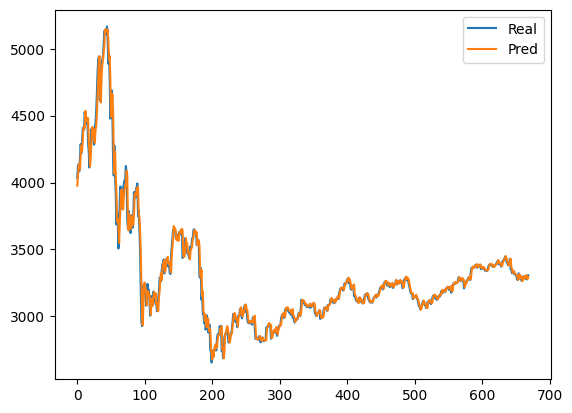

In [ ]:
y_test_signal=min_max_scaler.inverse_transform(test_ds.y.numpy().reshape(-1,1))
y_pred_signal=min_max_scaler.inverse_transform(y_pred.detach().cpu().numpy().reshape(-1,1))
plt.plot(y_test_signal, label="Real")
plt.plot(y_pred_signal, label="Pred")
plt.legend()
mlp_mae = mean_absolute_error(y_test_signal, y_pred_signal)
mlp_mape = mean_absolute_percentage_error(y_test_signal, y_pred_signal)
mlp_rmse = np.sqrt(mean_squared_error(y_test_signal, y_pred_signal))
mlp_r2 = r2_score(y_test_signal, y_pred_signal)


print(f"MLP MAE : {mlp_mae}")
print(f"MLP MAPE : {mlp_mape}")
print(f"MLP RMSE : {mlp_rmse}")
print(f"MLP R2 : {mlp_r2}")

In [ ]:
criterion = nn.L1Loss()
lstm_model = LSTMModel()
optimizer = optim.SGD(params=lstm_model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-5)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200, eta_min=1e-5)
scaler = amp.GradScaler()
trainer_lstm = Trainer(dataloaders, lstm_model, criterion, optimizer, scheduler=scheduler, num_epochs=200, model_name="lstm")
trainer_lstm.train()

  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 0, Train Loss: 0.1834, Train Acc: 0.1835, Valid Loss: 0.06674, Valid Acc: 0.06679
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 1, Train Loss: 0.05015, Train Acc: 0.0502, Valid Loss: 0.06206, Valid Acc: 0.06212
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 2, Train Loss: 0.04568, Train Acc: 0.04568, Valid Loss: 0.06009, Valid Acc: 0.06015
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 3, Train Loss: 0.04208, Train Acc: 0.04208, Valid Loss: 0.04124, Valid Acc: 0.04136
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 4, Train Loss: 0.04302, Train Acc: 0.04303, Valid Loss: 0.04135, Valid Acc: 0.04146



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 5, Train Loss: 0.0431, Train Acc: 0.04312, Valid Loss: 0.04749, Valid Acc: 0.0476



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 6, Train Loss: 0.04166, Train Acc: 0.04162, Valid Loss: 0.05239, Valid Acc: 0.05248



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 7, Train Loss: 0.03885, Train Acc: 0.03883, Valid Loss: 0.05584, Valid Acc: 0.05592



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 8, Train Loss: 0.04039, Train Acc: 0.0404, Valid Loss: 0.04011, Valid Acc: 0.04021
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 9, Train Loss: 0.03923, Train Acc: 0.03923, Valid Loss: 0.05149, Valid Acc: 0.05157



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 10, Train Loss: 0.03607, Train Acc: 0.03608, Valid Loss: 0.03823, Valid Acc: 0.03833
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 11, Train Loss: 0.03805, Train Acc: 0.03804, Valid Loss: 0.03966, Valid Acc: 0.03976



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 12, Train Loss: 0.03819, Train Acc: 0.0382, Valid Loss: 0.04061, Valid Acc: 0.04071



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 13, Train Loss: 0.03574, Train Acc: 0.03576, Valid Loss: 0.04008, Valid Acc: 0.04018



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 14, Train Loss: 0.03633, Train Acc: 0.03634, Valid Loss: 0.07666, Valid Acc: 0.07671



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 15, Train Loss: 0.03813, Train Acc: 0.03814, Valid Loss: 0.04928, Valid Acc: 0.04937



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 16, Train Loss: 0.03682, Train Acc: 0.03684, Valid Loss: 0.03777, Valid Acc: 0.03786
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 17, Train Loss: 0.03669, Train Acc: 0.03669, Valid Loss: 0.08771, Valid Acc: 0.08776



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 18, Train Loss: 0.03653, Train Acc: 0.03652, Valid Loss: 0.04592, Valid Acc: 0.04601



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 19, Train Loss: 0.03579, Train Acc: 0.03578, Valid Loss: 0.03963, Valid Acc: 0.03973



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 20, Train Loss: 0.03528, Train Acc: 0.03527, Valid Loss: 0.03866, Valid Acc: 0.03875



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 21, Train Loss: 0.03669, Train Acc: 0.03671, Valid Loss: 0.05667, Valid Acc: 0.05674



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 22, Train Loss: 0.03624, Train Acc: 0.03625, Valid Loss: 0.04526, Valid Acc: 0.04535



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 23, Train Loss: 0.03627, Train Acc: 0.03625, Valid Loss: 0.04442, Valid Acc: 0.0445



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 24, Train Loss: 0.03546, Train Acc: 0.03549, Valid Loss: 0.04606, Valid Acc: 0.04615



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 25, Train Loss: 0.03724, Train Acc: 0.03724, Valid Loss: 0.06783, Valid Acc: 0.06788



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 26, Train Loss: 0.0365, Train Acc: 0.0365, Valid Loss: 0.03908, Valid Acc: 0.03918



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 27, Train Loss: 0.03466, Train Acc: 0.03463, Valid Loss: 0.03743, Valid Acc: 0.03753
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 28, Train Loss: 0.03529, Train Acc: 0.03524, Valid Loss: 0.06209, Valid Acc: 0.06215



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 29, Train Loss: 0.03495, Train Acc: 0.03496, Valid Loss: 0.04275, Valid Acc: 0.04283



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 30, Train Loss: 0.03531, Train Acc: 0.03531, Valid Loss: 0.03712, Valid Acc: 0.03722
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 31, Train Loss: 0.03528, Train Acc: 0.03529, Valid Loss: 0.0437, Valid Acc: 0.04378



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 32, Train Loss: 0.03667, Train Acc: 0.03667, Valid Loss: 0.03791, Valid Acc: 0.038



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 33, Train Loss: 0.03509, Train Acc: 0.03511, Valid Loss: 0.03886, Valid Acc: 0.03895



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 34, Train Loss: 0.03541, Train Acc: 0.03541, Valid Loss: 0.0395, Valid Acc: 0.03959



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 35, Train Loss: 0.03571, Train Acc: 0.0357, Valid Loss: 0.04079, Valid Acc: 0.04088



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 36, Train Loss: 0.0358, Train Acc: 0.03582, Valid Loss: 0.03724, Valid Acc: 0.03733



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 37, Train Loss: 0.03581, Train Acc: 0.03581, Valid Loss: 0.0376, Valid Acc: 0.03769



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 38, Train Loss: 0.03454, Train Acc: 0.03455, Valid Loss: 0.0478, Valid Acc: 0.04789



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 39, Train Loss: 0.03414, Train Acc: 0.03416, Valid Loss: 0.03917, Valid Acc: 0.03926



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 40, Train Loss: 0.03445, Train Acc: 0.03444, Valid Loss: 0.03787, Valid Acc: 0.03797



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 41, Train Loss: 0.0352, Train Acc: 0.03521, Valid Loss: 0.03916, Valid Acc: 0.03925



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 42, Train Loss: 0.03557, Train Acc: 0.03554, Valid Loss: 0.03757, Valid Acc: 0.03766



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 43, Train Loss: 0.03468, Train Acc: 0.03466, Valid Loss: 0.04691, Valid Acc: 0.047



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 44, Train Loss: 0.03363, Train Acc: 0.03362, Valid Loss: 0.04646, Valid Acc: 0.04654



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 45, Train Loss: 0.03669, Train Acc: 0.03669, Valid Loss: 0.03789, Valid Acc: 0.03798



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 46, Train Loss: 0.03487, Train Acc: 0.03487, Valid Loss: 0.03789, Valid Acc: 0.03798



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 47, Train Loss: 0.03522, Train Acc: 0.03522, Valid Loss: 0.04322, Valid Acc: 0.04331



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 48, Train Loss: 0.03443, Train Acc: 0.03443, Valid Loss: 0.0374, Valid Acc: 0.03749



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 49, Train Loss: 0.03415, Train Acc: 0.03417, Valid Loss: 0.03775, Valid Acc: 0.03784



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 50, Train Loss: 0.03494, Train Acc: 0.03493, Valid Loss: 0.03887, Valid Acc: 0.03896



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 51, Train Loss: 0.03488, Train Acc: 0.03488, Valid Loss: 0.04133, Valid Acc: 0.04142



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 52, Train Loss: 0.03613, Train Acc: 0.03613, Valid Loss: 0.03955, Valid Acc: 0.03964



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 53, Train Loss: 0.03511, Train Acc: 0.03513, Valid Loss: 0.04067, Valid Acc: 0.04076



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 54, Train Loss: 0.03562, Train Acc: 0.03563, Valid Loss: 0.03725, Valid Acc: 0.03734



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 55, Train Loss: 0.03611, Train Acc: 0.03614, Valid Loss: 0.0371, Valid Acc: 0.03719
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 56, Train Loss: 0.03552, Train Acc: 0.03552, Valid Loss: 0.04508, Valid Acc: 0.04516



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 57, Train Loss: 0.03414, Train Acc: 0.03414, Valid Loss: 0.03699, Valid Acc: 0.03708
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 58, Train Loss: 0.03406, Train Acc: 0.03406, Valid Loss: 0.03997, Valid Acc: 0.04006



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 59, Train Loss: 0.03454, Train Acc: 0.03455, Valid Loss: 0.03884, Valid Acc: 0.03893



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 60, Train Loss: 0.03494, Train Acc: 0.03494, Valid Loss: 0.04135, Valid Acc: 0.04145



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 61, Train Loss: 0.03449, Train Acc: 0.03449, Valid Loss: 0.04829, Valid Acc: 0.04838



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 62, Train Loss: 0.03418, Train Acc: 0.03418, Valid Loss: 0.03739, Valid Acc: 0.03747



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 63, Train Loss: 0.03398, Train Acc: 0.034, Valid Loss: 0.0378, Valid Acc: 0.03789



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 64, Train Loss: 0.03598, Train Acc: 0.03602, Valid Loss: 0.03826, Valid Acc: 0.03835



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 65, Train Loss: 0.03479, Train Acc: 0.03481, Valid Loss: 0.03763, Valid Acc: 0.03772



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 66, Train Loss: 0.0341, Train Acc: 0.03409, Valid Loss: 0.03733, Valid Acc: 0.03742



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 67, Train Loss: 0.03581, Train Acc: 0.03584, Valid Loss: 0.03701, Valid Acc: 0.0371



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 68, Train Loss: 0.03353, Train Acc: 0.03353, Valid Loss: 0.03785, Valid Acc: 0.03793



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 69, Train Loss: 0.03549, Train Acc: 0.03548, Valid Loss: 0.03994, Valid Acc: 0.04003



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 70, Train Loss: 0.03483, Train Acc: 0.03483, Valid Loss: 0.04859, Valid Acc: 0.04868



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 71, Train Loss: 0.03337, Train Acc: 0.03338, Valid Loss: 0.03691, Valid Acc: 0.037
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 72, Train Loss: 0.03499, Train Acc: 0.03498, Valid Loss: 0.03776, Valid Acc: 0.03785



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 73, Train Loss: 0.03446, Train Acc: 0.03447, Valid Loss: 0.04767, Valid Acc: 0.04776



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 74, Train Loss: 0.03543, Train Acc: 0.03544, Valid Loss: 0.04364, Valid Acc: 0.04373



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 75, Train Loss: 0.03402, Train Acc: 0.03403, Valid Loss: 0.04236, Valid Acc: 0.04245



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 76, Train Loss: 0.03574, Train Acc: 0.03575, Valid Loss: 0.03751, Valid Acc: 0.03759



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 77, Train Loss: 0.03362, Train Acc: 0.03361, Valid Loss: 0.04283, Valid Acc: 0.04292



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 78, Train Loss: 0.03379, Train Acc: 0.03382, Valid Loss: 0.04166, Valid Acc: 0.04175



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 79, Train Loss: 0.03358, Train Acc: 0.03359, Valid Loss: 0.03719, Valid Acc: 0.03728



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 80, Train Loss: 0.03324, Train Acc: 0.03327, Valid Loss: 0.03692, Valid Acc: 0.03701



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 81, Train Loss: 0.03379, Train Acc: 0.03379, Valid Loss: 0.03738, Valid Acc: 0.03747



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 82, Train Loss: 0.03443, Train Acc: 0.03443, Valid Loss: 0.03751, Valid Acc: 0.0376



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 83, Train Loss: 0.03378, Train Acc: 0.03381, Valid Loss: 0.0449, Valid Acc: 0.04498



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 84, Train Loss: 0.03399, Train Acc: 0.03401, Valid Loss: 0.04132, Valid Acc: 0.04141



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 85, Train Loss: 0.0341, Train Acc: 0.03409, Valid Loss: 0.04167, Valid Acc: 0.04176



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 86, Train Loss: 0.0331, Train Acc: 0.03308, Valid Loss: 0.03701, Valid Acc: 0.03709



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 87, Train Loss: 0.03332, Train Acc: 0.03331, Valid Loss: 0.03731, Valid Acc: 0.0374



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 88, Train Loss: 0.03409, Train Acc: 0.03408, Valid Loss: 0.03931, Valid Acc: 0.0394



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 89, Train Loss: 0.03428, Train Acc: 0.03427, Valid Loss: 0.03701, Valid Acc: 0.0371



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 90, Train Loss: 0.03297, Train Acc: 0.03299, Valid Loss: 0.03915, Valid Acc: 0.03924



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 91, Train Loss: 0.03259, Train Acc: 0.0326, Valid Loss: 0.04856, Valid Acc: 0.04865



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 92, Train Loss: 0.03386, Train Acc: 0.03385, Valid Loss: 0.03898, Valid Acc: 0.03908



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 93, Train Loss: 0.03412, Train Acc: 0.03412, Valid Loss: 0.03847, Valid Acc: 0.03856



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 94, Train Loss: 0.03271, Train Acc: 0.03273, Valid Loss: 0.03952, Valid Acc: 0.03961



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 95, Train Loss: 0.03399, Train Acc: 0.034, Valid Loss: 0.03936, Valid Acc: 0.03945



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 96, Train Loss: 0.03325, Train Acc: 0.03324, Valid Loss: 0.03797, Valid Acc: 0.03806



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 97, Train Loss: 0.03278, Train Acc: 0.03279, Valid Loss: 0.05694, Valid Acc: 0.05701



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 98, Train Loss: 0.03277, Train Acc: 0.03275, Valid Loss: 0.03693, Valid Acc: 0.03702



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 99, Train Loss: 0.03389, Train Acc: 0.0339, Valid Loss: 0.03738, Valid Acc: 0.03747



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 100, Train Loss: 0.03334, Train Acc: 0.03336, Valid Loss: 0.04316, Valid Acc: 0.04325



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 101, Train Loss: 0.03357, Train Acc: 0.03358, Valid Loss: 0.03765, Valid Acc: 0.03774



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 102, Train Loss: 0.03309, Train Acc: 0.03311, Valid Loss: 0.03708, Valid Acc: 0.03716



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 103, Train Loss: 0.03266, Train Acc: 0.03265, Valid Loss: 0.0369, Valid Acc: 0.03699
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 104, Train Loss: 0.033, Train Acc: 0.033, Valid Loss: 0.03715, Valid Acc: 0.03724



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 105, Train Loss: 0.03267, Train Acc: 0.03264, Valid Loss: 0.03769, Valid Acc: 0.03778



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 106, Train Loss: 0.03281, Train Acc: 0.03282, Valid Loss: 0.03734, Valid Acc: 0.03742



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 107, Train Loss: 0.03292, Train Acc: 0.03292, Valid Loss: 0.04325, Valid Acc: 0.04334



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 108, Train Loss: 0.03315, Train Acc: 0.03313, Valid Loss: 0.03693, Valid Acc: 0.03701



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 109, Train Loss: 0.03256, Train Acc: 0.03256, Valid Loss: 0.03741, Valid Acc: 0.03749



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 110, Train Loss: 0.03292, Train Acc: 0.03294, Valid Loss: 0.03753, Valid Acc: 0.03762



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 111, Train Loss: 0.03308, Train Acc: 0.03309, Valid Loss: 0.03819, Valid Acc: 0.03828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 112, Train Loss: 0.03249, Train Acc: 0.03252, Valid Loss: 0.03749, Valid Acc: 0.03758



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 113, Train Loss: 0.03353, Train Acc: 0.03353, Valid Loss: 0.03713, Valid Acc: 0.03722



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 114, Train Loss: 0.03239, Train Acc: 0.03239, Valid Loss: 0.03754, Valid Acc: 0.03763



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 115, Train Loss: 0.03272, Train Acc: 0.03274, Valid Loss: 0.037, Valid Acc: 0.03709



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 116, Train Loss: 0.03263, Train Acc: 0.0326, Valid Loss: 0.04221, Valid Acc: 0.0423



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 117, Train Loss: 0.03289, Train Acc: 0.0329, Valid Loss: 0.03829, Valid Acc: 0.03838



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 118, Train Loss: 0.03271, Train Acc: 0.0327, Valid Loss: 0.03813, Valid Acc: 0.03822



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 119, Train Loss: 0.03249, Train Acc: 0.03249, Valid Loss: 0.03756, Valid Acc: 0.03765



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 120, Train Loss: 0.03198, Train Acc: 0.032, Valid Loss: 0.03806, Valid Acc: 0.03815



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 121, Train Loss: 0.03239, Train Acc: 0.0324, Valid Loss: 0.03798, Valid Acc: 0.03807



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 122, Train Loss: 0.03214, Train Acc: 0.03216, Valid Loss: 0.03755, Valid Acc: 0.03764



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 123, Train Loss: 0.03257, Train Acc: 0.03256, Valid Loss: 0.03733, Valid Acc: 0.03742



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 124, Train Loss: 0.03248, Train Acc: 0.0325, Valid Loss: 0.03722, Valid Acc: 0.03731



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 125, Train Loss: 0.03297, Train Acc: 0.03297, Valid Loss: 0.03693, Valid Acc: 0.03701



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 126, Train Loss: 0.03218, Train Acc: 0.0322, Valid Loss: 0.03743, Valid Acc: 0.03752



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 127, Train Loss: 0.03231, Train Acc: 0.03229, Valid Loss: 0.0386, Valid Acc: 0.03869



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 128, Train Loss: 0.03255, Train Acc: 0.03255, Valid Loss: 0.03889, Valid Acc: 0.03898



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 129, Train Loss: 0.03219, Train Acc: 0.03219, Valid Loss: 0.03768, Valid Acc: 0.03776



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 130, Train Loss: 0.03206, Train Acc: 0.03206, Valid Loss: 0.04009, Valid Acc: 0.04019



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 131, Train Loss: 0.03248, Train Acc: 0.0325, Valid Loss: 0.03769, Valid Acc: 0.03778



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 132, Train Loss: 0.03222, Train Acc: 0.03223, Valid Loss: 0.04286, Valid Acc: 0.04295



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 133, Train Loss: 0.03192, Train Acc: 0.0319, Valid Loss: 0.03794, Valid Acc: 0.03803



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 134, Train Loss: 0.03219, Train Acc: 0.03221, Valid Loss: 0.03744, Valid Acc: 0.03753



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 135, Train Loss: 0.03192, Train Acc: 0.0319, Valid Loss: 0.03692, Valid Acc: 0.037



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 136, Train Loss: 0.03215, Train Acc: 0.03214, Valid Loss: 0.03704, Valid Acc: 0.03712



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 137, Train Loss: 0.03232, Train Acc: 0.03232, Valid Loss: 0.0373, Valid Acc: 0.03739



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 138, Train Loss: 0.03214, Train Acc: 0.03213, Valid Loss: 0.03858, Valid Acc: 0.03867



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 139, Train Loss: 0.03234, Train Acc: 0.03236, Valid Loss: 0.03691, Valid Acc: 0.037



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 140, Train Loss: 0.03217, Train Acc: 0.03218, Valid Loss: 0.04044, Valid Acc: 0.04053



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 141, Train Loss: 0.03235, Train Acc: 0.03235, Valid Loss: 0.03831, Valid Acc: 0.0384



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 142, Train Loss: 0.03202, Train Acc: 0.03202, Valid Loss: 0.0382, Valid Acc: 0.03829



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 143, Train Loss: 0.0319, Train Acc: 0.03186, Valid Loss: 0.03701, Valid Acc: 0.03709



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 144, Train Loss: 0.03205, Train Acc: 0.03205, Valid Loss: 0.04118, Valid Acc: 0.04128



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 145, Train Loss: 0.03173, Train Acc: 0.03171, Valid Loss: 0.03956, Valid Acc: 0.03965



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 146, Train Loss: 0.03187, Train Acc: 0.03185, Valid Loss: 0.0383, Valid Acc: 0.03839



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 147, Train Loss: 0.03179, Train Acc: 0.0318, Valid Loss: 0.0388, Valid Acc: 0.03889



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 148, Train Loss: 0.03187, Train Acc: 0.03187, Valid Loss: 0.03795, Valid Acc: 0.03804



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 149, Train Loss: 0.03195, Train Acc: 0.03198, Valid Loss: 0.03729, Valid Acc: 0.03737



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 150, Train Loss: 0.03223, Train Acc: 0.03225, Valid Loss: 0.03698, Valid Acc: 0.03707



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 151, Train Loss: 0.03171, Train Acc: 0.03173, Valid Loss: 0.0379, Valid Acc: 0.03799



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 152, Train Loss: 0.03193, Train Acc: 0.03193, Valid Loss: 0.03784, Valid Acc: 0.03793



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 153, Train Loss: 0.03177, Train Acc: 0.03176, Valid Loss: 0.03815, Valid Acc: 0.03824



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 154, Train Loss: 0.0316, Train Acc: 0.0316, Valid Loss: 0.03699, Valid Acc: 0.03707



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 155, Train Loss: 0.03166, Train Acc: 0.03163, Valid Loss: 0.03758, Valid Acc: 0.03767



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 156, Train Loss: 0.03183, Train Acc: 0.03185, Valid Loss: 0.03698, Valid Acc: 0.03707



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 157, Train Loss: 0.03163, Train Acc: 0.03162, Valid Loss: 0.03735, Valid Acc: 0.03744



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 158, Train Loss: 0.03154, Train Acc: 0.03157, Valid Loss: 0.03704, Valid Acc: 0.03713



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 159, Train Loss: 0.0318, Train Acc: 0.0318, Valid Loss: 0.03723, Valid Acc: 0.03731



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 160, Train Loss: 0.03155, Train Acc: 0.03157, Valid Loss: 0.03738, Valid Acc: 0.03746



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 161, Train Loss: 0.03165, Train Acc: 0.03165, Valid Loss: 0.03839, Valid Acc: 0.03848



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 162, Train Loss: 0.03157, Train Acc: 0.03158, Valid Loss: 0.03705, Valid Acc: 0.03713



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 163, Train Loss: 0.03169, Train Acc: 0.03167, Valid Loss: 0.03761, Valid Acc: 0.0377



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 164, Train Loss: 0.03153, Train Acc: 0.03154, Valid Loss: 0.03702, Valid Acc: 0.03711



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 165, Train Loss: 0.03164, Train Acc: 0.03164, Valid Loss: 0.03707, Valid Acc: 0.03716



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 166, Train Loss: 0.03154, Train Acc: 0.03153, Valid Loss: 0.03813, Valid Acc: 0.03822



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 167, Train Loss: 0.03155, Train Acc: 0.03155, Valid Loss: 0.03727, Valid Acc: 0.03735



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 168, Train Loss: 0.03162, Train Acc: 0.03163, Valid Loss: 0.03861, Valid Acc: 0.0387



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 169, Train Loss: 0.03147, Train Acc: 0.03145, Valid Loss: 0.03754, Valid Acc: 0.03762



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 170, Train Loss: 0.03151, Train Acc: 0.03151, Valid Loss: 0.03898, Valid Acc: 0.03907



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 171, Train Loss: 0.03141, Train Acc: 0.03143, Valid Loss: 0.03716, Valid Acc: 0.03725



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 172, Train Loss: 0.03147, Train Acc: 0.03146, Valid Loss: 0.03707, Valid Acc: 0.03716



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 173, Train Loss: 0.03149, Train Acc: 0.03149, Valid Loss: 0.03882, Valid Acc: 0.03891



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 174, Train Loss: 0.03138, Train Acc: 0.03139, Valid Loss: 0.03748, Valid Acc: 0.03756



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 175, Train Loss: 0.03143, Train Acc: 0.03142, Valid Loss: 0.03712, Valid Acc: 0.03721



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 176, Train Loss: 0.03142, Train Acc: 0.03141, Valid Loss: 0.03818, Valid Acc: 0.03827



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 177, Train Loss: 0.03141, Train Acc: 0.03141, Valid Loss: 0.03728, Valid Acc: 0.03736



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 178, Train Loss: 0.03146, Train Acc: 0.03145, Valid Loss: 0.03742, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 179, Train Loss: 0.03139, Train Acc: 0.0314, Valid Loss: 0.03802, Valid Acc: 0.03811



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 180, Train Loss: 0.03145, Train Acc: 0.03141, Valid Loss: 0.03707, Valid Acc: 0.03715



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 181, Train Loss: 0.03141, Train Acc: 0.03142, Valid Loss: 0.03827, Valid Acc: 0.03836



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 182, Train Loss: 0.0314, Train Acc: 0.0314, Valid Loss: 0.03731, Valid Acc: 0.0374



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 183, Train Loss: 0.03137, Train Acc: 0.03138, Valid Loss: 0.03716, Valid Acc: 0.03725



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 184, Train Loss: 0.03139, Train Acc: 0.03136, Valid Loss: 0.037, Valid Acc: 0.03709



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 185, Train Loss: 0.03136, Train Acc: 0.03135, Valid Loss: 0.03716, Valid Acc: 0.03724



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 186, Train Loss: 0.03136, Train Acc: 0.03137, Valid Loss: 0.03733, Valid Acc: 0.03741



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 187, Train Loss: 0.03135, Train Acc: 0.03134, Valid Loss: 0.0373, Valid Acc: 0.03738



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 188, Train Loss: 0.03135, Train Acc: 0.03133, Valid Loss: 0.03705, Valid Acc: 0.03713



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 189, Train Loss: 0.03133, Train Acc: 0.03133, Valid Loss: 0.03762, Valid Acc: 0.03771



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 190, Train Loss: 0.03133, Train Acc: 0.03134, Valid Loss: 0.03742, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 191, Train Loss: 0.03131, Train Acc: 0.03132, Valid Loss: 0.03735, Valid Acc: 0.03743



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 192, Train Loss: 0.03131, Train Acc: 0.03132, Valid Loss: 0.03717, Valid Acc: 0.03726



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 193, Train Loss: 0.03131, Train Acc: 0.03132, Valid Loss: 0.03723, Valid Acc: 0.03732



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 194, Train Loss: 0.03132, Train Acc: 0.03132, Valid Loss: 0.03729, Valid Acc: 0.03738



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 195, Train Loss: 0.03131, Train Acc: 0.03131, Valid Loss: 0.03724, Valid Acc: 0.03733



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 196, Train Loss: 0.0313, Train Acc: 0.03132, Valid Loss: 0.0373, Valid Acc: 0.03738



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 197, Train Loss: 0.03129, Train Acc: 0.03131, Valid Loss: 0.03725, Valid Acc: 0.03734



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 198, Train Loss: 0.0313, Train Acc: 0.03131, Valid Loss: 0.03725, Valid Acc: 0.03733



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 199, Train Loss: 0.0313, Train Acc: 0.0313, Valid Loss: 0.03724, Valid Acc: 0.03732



In [ ]:
y_pred = trainer_lstm.test(test_ds.x)
y_pred.shape, test_ds.y.shape



(torch.Size([669]), torch.Size([669]))

LSTM MAE : 34.952823638916016
LSTM MAPE : 0.01008888240903616
LSTM RMSE : 61.53785705566406
LSTM R2 : 0.981517603787469


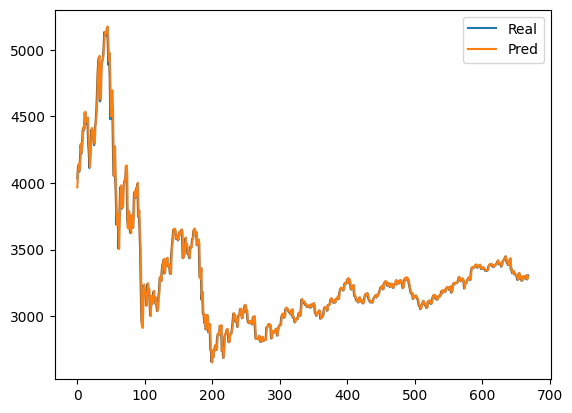

In [ ]:
y_test_signal=min_max_scaler.inverse_transform(test_ds.y.numpy().reshape(-1,1))
y_pred_signal=min_max_scaler.inverse_transform(y_pred.detach().cpu().numpy().reshape(-1,1))
plt.plot(y_test_signal, label="Real")
plt.plot(y_pred_signal, label="Pred")
plt.legend()
lstm_mae = mean_absolute_error(y_test_signal, y_pred_signal)
lstm_mape = mean_absolute_percentage_error(y_test_signal, y_pred_signal)
lstm_rmse = np.sqrt(mean_squared_error(y_test_signal, y_pred_signal))
lstm_r2 = r2_score(y_test_signal, y_pred_signal)

print(f"LSTM MAE : {lstm_mae}")
print(f"LSTM MAPE : {lstm_mape}")
print(f"LSTM RMSE : {lstm_rmse}")
print(f"LSTM R2 : {lstm_r2}")

In [ ]:
criterion = nn.L1Loss()
attn_model = AttnLSTM()
optimizer = optim.SGD(params=attn_model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-5)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=200, eta_min=1e-5)
scaler = amp.GradScaler()
trainer_attn = Trainer(dataloaders, attn_model, criterion, optimizer, scheduler=scheduler, num_epochs=200, model_name="attn")
trainer_attn.train()

  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 0, Train Loss: 0.2431, Train Acc: 0.2432, Valid Loss: 0.1336, Valid Acc: 0.1337
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 1, Train Loss: 0.1135, Train Acc: 0.1136, Valid Loss: 0.1433, Valid Acc: 0.1434



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 2, Train Loss: 0.1117, Train Acc: 0.1116, Valid Loss: 0.1254, Valid Acc: 0.1256
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 3, Train Loss: 0.1092, Train Acc: 0.1091, Valid Loss: 0.1236, Valid Acc: 0.124
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 4, Train Loss: 0.1091, Train Acc: 0.1091, Valid Loss: 0.1144, Valid Acc: 0.1147
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 5, Train Loss: 0.1077, Train Acc: 0.1077, Valid Loss: 0.1156, Valid Acc: 0.1158



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 6, Train Loss: 0.106, Train Acc: 0.106, Valid Loss: 0.114, Valid Acc: 0.1143
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 7, Train Loss: 0.1082, Train Acc: 0.1081, Valid Loss: 0.1159, Valid Acc: 0.1162



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 8, Train Loss: 0.1065, Train Acc: 0.1064, Valid Loss: 0.111, Valid Acc: 0.1114
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 9, Train Loss: 0.1036, Train Acc: 0.1036, Valid Loss: 0.1133, Valid Acc: 0.1137



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 10, Train Loss: 0.1036, Train Acc: 0.1037, Valid Loss: 0.115, Valid Acc: 0.1153



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 11, Train Loss: 0.1014, Train Acc: 0.1014, Valid Loss: 0.1195, Valid Acc: 0.1199



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 12, Train Loss: 0.1011, Train Acc: 0.1011, Valid Loss: 0.1094, Valid Acc: 0.1098
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 13, Train Loss: 0.1015, Train Acc: 0.1015, Valid Loss: 0.1089, Valid Acc: 0.1093
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 14, Train Loss: 0.1026, Train Acc: 0.1027, Valid Loss: 0.1051, Valid Acc: 0.1054
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 15, Train Loss: 0.09892, Train Acc: 0.09891, Valid Loss: 0.1051, Valid Acc: 0.1054
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 16, Train Loss: 0.09781, Train Acc: 0.09786, Valid Loss: 0.1108, Valid Acc: 0.1112



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 17, Train Loss: 0.1009, Train Acc: 0.1008, Valid Loss: 0.1101, Valid Acc: 0.1103



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 18, Train Loss: 0.09695, Train Acc: 0.09697, Valid Loss: 0.1091, Valid Acc: 0.1094



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 19, Train Loss: 0.09411, Train Acc: 0.09411, Valid Loss: 0.09564, Valid Acc: 0.09596
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 20, Train Loss: 0.09442, Train Acc: 0.09441, Valid Loss: 0.1431, Valid Acc: 0.1433



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 21, Train Loss: 0.09005, Train Acc: 0.09009, Valid Loss: 0.1166, Valid Acc: 0.1167



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 22, Train Loss: 0.08649, Train Acc: 0.08652, Valid Loss: 0.09021, Valid Acc: 0.09048
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 23, Train Loss: 0.08188, Train Acc: 0.08187, Valid Loss: 0.1485, Valid Acc: 0.1486



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 24, Train Loss: 0.07742, Train Acc: 0.07745, Valid Loss: 0.06239, Valid Acc: 0.0626
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 25, Train Loss: 0.07105, Train Acc: 0.07106, Valid Loss: 0.1948, Valid Acc: 0.1947



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 26, Train Loss: 0.06737, Train Acc: 0.06738, Valid Loss: 0.04993, Valid Acc: 0.05008
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 27, Train Loss: 0.05697, Train Acc: 0.05694, Valid Loss: 0.076, Valid Acc: 0.07609



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 28, Train Loss: 0.0535, Train Acc: 0.05339, Valid Loss: 0.09969, Valid Acc: 0.0997



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 29, Train Loss: 0.05676, Train Acc: 0.05677, Valid Loss: 0.04987, Valid Acc: 0.05002
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 30, Train Loss: 0.05603, Train Acc: 0.05594, Valid Loss: 0.1773, Valid Acc: 0.1773



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 31, Train Loss: 0.05719, Train Acc: 0.05721, Valid Loss: 0.04736, Valid Acc: 0.04748
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 32, Train Loss: 0.05351, Train Acc: 0.05349, Valid Loss: 0.05155, Valid Acc: 0.05166



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 33, Train Loss: 0.05111, Train Acc: 0.05111, Valid Loss: 0.04848, Valid Acc: 0.04862



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 34, Train Loss: 0.05378, Train Acc: 0.05377, Valid Loss: 0.07103, Valid Acc: 0.0711



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 35, Train Loss: 0.04714, Train Acc: 0.04716, Valid Loss: 0.06613, Valid Acc: 0.06619



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 36, Train Loss: 0.05069, Train Acc: 0.05072, Valid Loss: 0.04818, Valid Acc: 0.04829



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 37, Train Loss: 0.04886, Train Acc: 0.04876, Valid Loss: 0.1728, Valid Acc: 0.1728



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 38, Train Loss: 0.05413, Train Acc: 0.05417, Valid Loss: 0.0492, Valid Acc: 0.0493



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 39, Train Loss: 0.04281, Train Acc: 0.04284, Valid Loss: 0.06012, Valid Acc: 0.06019



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 40, Train Loss: 0.04852, Train Acc: 0.04853, Valid Loss: 0.05519, Valid Acc: 0.05526



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 41, Train Loss: 0.04651, Train Acc: 0.04652, Valid Loss: 0.04181, Valid Acc: 0.04191
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 42, Train Loss: 0.05367, Train Acc: 0.05366, Valid Loss: 0.03968, Valid Acc: 0.03979
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 43, Train Loss: 0.04186, Train Acc: 0.04185, Valid Loss: 0.0415, Valid Acc: 0.04161



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 44, Train Loss: 0.04539, Train Acc: 0.04539, Valid Loss: 0.04152, Valid Acc: 0.04163



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 45, Train Loss: 0.04448, Train Acc: 0.04448, Valid Loss: 0.05724, Valid Acc: 0.05731



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 46, Train Loss: 0.04412, Train Acc: 0.04413, Valid Loss: 0.04228, Valid Acc: 0.04239



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 47, Train Loss: 0.04078, Train Acc: 0.04079, Valid Loss: 0.03878, Valid Acc: 0.03889
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 48, Train Loss: 0.0417, Train Acc: 0.04171, Valid Loss: 0.04049, Valid Acc: 0.04058



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 49, Train Loss: 0.04053, Train Acc: 0.04056, Valid Loss: 0.05355, Valid Acc: 0.05362



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 50, Train Loss: 0.0395, Train Acc: 0.0395, Valid Loss: 0.0416, Valid Acc: 0.0417



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 51, Train Loss: 0.04317, Train Acc: 0.04315, Valid Loss: 0.07447, Valid Acc: 0.07453



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 52, Train Loss: 0.042, Train Acc: 0.04202, Valid Loss: 0.04028, Valid Acc: 0.04038



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 53, Train Loss: 0.0424, Train Acc: 0.04243, Valid Loss: 0.04653, Valid Acc: 0.04662



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 54, Train Loss: 0.03979, Train Acc: 0.0398, Valid Loss: 0.04227, Valid Acc: 0.04236



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 55, Train Loss: 0.04014, Train Acc: 0.04016, Valid Loss: 0.05723, Valid Acc: 0.05729



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 56, Train Loss: 0.03849, Train Acc: 0.03851, Valid Loss: 0.05823, Valid Acc: 0.0583



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 57, Train Loss: 0.03867, Train Acc: 0.03866, Valid Loss: 0.04702, Valid Acc: 0.0471



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 58, Train Loss: 0.03834, Train Acc: 0.03835, Valid Loss: 0.05669, Valid Acc: 0.05676



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 59, Train Loss: 0.04153, Train Acc: 0.04153, Valid Loss: 0.05697, Valid Acc: 0.05704



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 60, Train Loss: 0.03984, Train Acc: 0.03984, Valid Loss: 0.04083, Valid Acc: 0.04093



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 61, Train Loss: 0.04041, Train Acc: 0.04039, Valid Loss: 0.06285, Valid Acc: 0.0629



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 62, Train Loss: 0.04029, Train Acc: 0.04029, Valid Loss: 0.04091, Valid Acc: 0.04102



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 63, Train Loss: 0.04377, Train Acc: 0.0438, Valid Loss: 0.04048, Valid Acc: 0.04059



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 64, Train Loss: 0.03978, Train Acc: 0.03982, Valid Loss: 0.04951, Valid Acc: 0.04959



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 65, Train Loss: 0.03727, Train Acc: 0.03728, Valid Loss: 0.04007, Valid Acc: 0.04016



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 66, Train Loss: 0.03842, Train Acc: 0.03839, Valid Loss: 0.03795, Valid Acc: 0.03804
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 67, Train Loss: 0.03872, Train Acc: 0.03874, Valid Loss: 0.04328, Valid Acc: 0.04336



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 68, Train Loss: 0.04013, Train Acc: 0.04014, Valid Loss: 0.04466, Valid Acc: 0.04476



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 69, Train Loss: 0.03857, Train Acc: 0.03856, Valid Loss: 0.03768, Valid Acc: 0.03777
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 70, Train Loss: 0.0443, Train Acc: 0.04432, Valid Loss: 0.04819, Valid Acc: 0.04828



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 71, Train Loss: 0.03769, Train Acc: 0.0377, Valid Loss: 0.03817, Valid Acc: 0.03826



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 72, Train Loss: 0.03825, Train Acc: 0.03825, Valid Loss: 0.05932, Valid Acc: 0.05939



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 73, Train Loss: 0.03916, Train Acc: 0.03918, Valid Loss: 0.04126, Valid Acc: 0.04135



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 74, Train Loss: 0.03849, Train Acc: 0.03851, Valid Loss: 0.0432, Valid Acc: 0.04329



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 75, Train Loss: 0.03853, Train Acc: 0.03855, Valid Loss: 0.03952, Valid Acc: 0.03962



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 76, Train Loss: 0.03519, Train Acc: 0.0352, Valid Loss: 0.04042, Valid Acc: 0.04051



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 77, Train Loss: 0.03708, Train Acc: 0.03707, Valid Loss: 0.04517, Valid Acc: 0.04526



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 78, Train Loss: 0.03676, Train Acc: 0.03679, Valid Loss: 0.05956, Valid Acc: 0.05963



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 79, Train Loss: 0.03762, Train Acc: 0.03763, Valid Loss: 0.04395, Valid Acc: 0.04404



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 80, Train Loss: 0.03975, Train Acc: 0.03978, Valid Loss: 0.04262, Valid Acc: 0.04274



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 81, Train Loss: 0.03713, Train Acc: 0.0371, Valid Loss: 0.05206, Valid Acc: 0.05214



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 82, Train Loss: 0.03746, Train Acc: 0.03747, Valid Loss: 0.05719, Valid Acc: 0.05724



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 83, Train Loss: 0.03618, Train Acc: 0.03621, Valid Loss: 0.04131, Valid Acc: 0.0414



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 84, Train Loss: 0.03623, Train Acc: 0.03623, Valid Loss: 0.03746, Valid Acc: 0.03755
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 85, Train Loss: 0.03756, Train Acc: 0.03752, Valid Loss: 0.04194, Valid Acc: 0.04203



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 86, Train Loss: 0.03676, Train Acc: 0.03675, Valid Loss: 0.0481, Valid Acc: 0.04818



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 87, Train Loss: 0.03626, Train Acc: 0.03625, Valid Loss: 0.03751, Valid Acc: 0.0376



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 88, Train Loss: 0.03529, Train Acc: 0.03527, Valid Loss: 0.04083, Valid Acc: 0.04092



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 89, Train Loss: 0.03706, Train Acc: 0.03704, Valid Loss: 0.04323, Valid Acc: 0.04333



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 90, Train Loss: 0.03723, Train Acc: 0.03727, Valid Loss: 0.04914, Valid Acc: 0.04923



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 91, Train Loss: 0.0351, Train Acc: 0.03509, Valid Loss: 0.05622, Valid Acc: 0.05628



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 92, Train Loss: 0.03623, Train Acc: 0.03621, Valid Loss: 0.03987, Valid Acc: 0.03996



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 93, Train Loss: 0.03765, Train Acc: 0.03763, Valid Loss: 0.04048, Valid Acc: 0.04057



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 94, Train Loss: 0.03614, Train Acc: 0.03616, Valid Loss: 0.05895, Valid Acc: 0.05901



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 95, Train Loss: 0.03555, Train Acc: 0.03556, Valid Loss: 0.0484, Valid Acc: 0.04848



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 96, Train Loss: 0.03584, Train Acc: 0.03583, Valid Loss: 0.03733, Valid Acc: 0.03742
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 97, Train Loss: 0.03583, Train Acc: 0.03585, Valid Loss: 0.05297, Valid Acc: 0.05304



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 98, Train Loss: 0.0342, Train Acc: 0.03419, Valid Loss: 0.04151, Valid Acc: 0.0416



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 99, Train Loss: 0.03526, Train Acc: 0.03528, Valid Loss: 0.05006, Valid Acc: 0.05014



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 100, Train Loss: 0.0344, Train Acc: 0.03442, Valid Loss: 0.03716, Valid Acc: 0.03725
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 101, Train Loss: 0.0346, Train Acc: 0.03462, Valid Loss: 0.03741, Valid Acc: 0.0375



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 102, Train Loss: 0.03514, Train Acc: 0.03516, Valid Loss: 0.03724, Valid Acc: 0.03732



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 103, Train Loss: 0.0349, Train Acc: 0.03489, Valid Loss: 0.04105, Valid Acc: 0.04114



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 104, Train Loss: 0.03613, Train Acc: 0.03613, Valid Loss: 0.04151, Valid Acc: 0.04159



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 105, Train Loss: 0.03582, Train Acc: 0.0358, Valid Loss: 0.03806, Valid Acc: 0.03815



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 106, Train Loss: 0.03574, Train Acc: 0.03574, Valid Loss: 0.0385, Valid Acc: 0.03859



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 107, Train Loss: 0.03415, Train Acc: 0.03415, Valid Loss: 0.04164, Valid Acc: 0.04174



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 108, Train Loss: 0.03487, Train Acc: 0.03485, Valid Loss: 0.03892, Valid Acc: 0.03901



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 109, Train Loss: 0.03427, Train Acc: 0.03428, Valid Loss: 0.03716, Valid Acc: 0.03724
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 110, Train Loss: 0.03403, Train Acc: 0.03405, Valid Loss: 0.0488, Valid Acc: 0.04888



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 111, Train Loss: 0.03386, Train Acc: 0.03387, Valid Loss: 0.03757, Valid Acc: 0.03765



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 112, Train Loss: 0.03515, Train Acc: 0.03517, Valid Loss: 0.03794, Valid Acc: 0.03803



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 113, Train Loss: 0.03405, Train Acc: 0.03405, Valid Loss: 0.03715, Valid Acc: 0.03723
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 114, Train Loss: 0.0329, Train Acc: 0.0329, Valid Loss: 0.03733, Valid Acc: 0.03742



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 115, Train Loss: 0.03334, Train Acc: 0.03335, Valid Loss: 0.03726, Valid Acc: 0.03735



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 116, Train Loss: 0.03407, Train Acc: 0.03403, Valid Loss: 0.03923, Valid Acc: 0.03932



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 117, Train Loss: 0.0338, Train Acc: 0.03381, Valid Loss: 0.03731, Valid Acc: 0.0374



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 118, Train Loss: 0.03347, Train Acc: 0.03346, Valid Loss: 0.03733, Valid Acc: 0.03741



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 119, Train Loss: 0.03287, Train Acc: 0.03286, Valid Loss: 0.03742, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 120, Train Loss: 0.03295, Train Acc: 0.03297, Valid Loss: 0.04143, Valid Acc: 0.04152



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 121, Train Loss: 0.03341, Train Acc: 0.03342, Valid Loss: 0.0499, Valid Acc: 0.04998



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 122, Train Loss: 0.03276, Train Acc: 0.03278, Valid Loss: 0.0374, Valid Acc: 0.03748



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 123, Train Loss: 0.03435, Train Acc: 0.03434, Valid Loss: 0.0401, Valid Acc: 0.04019



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 124, Train Loss: 0.03297, Train Acc: 0.03299, Valid Loss: 0.0379, Valid Acc: 0.03798



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 125, Train Loss: 0.03294, Train Acc: 0.03293, Valid Loss: 0.03848, Valid Acc: 0.03857



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 126, Train Loss: 0.03322, Train Acc: 0.03324, Valid Loss: 0.03998, Valid Acc: 0.04008



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 127, Train Loss: 0.03361, Train Acc: 0.03359, Valid Loss: 0.03703, Valid Acc: 0.03712
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 128, Train Loss: 0.03347, Train Acc: 0.03347, Valid Loss: 0.04246, Valid Acc: 0.04255



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 129, Train Loss: 0.03376, Train Acc: 0.03376, Valid Loss: 0.03742, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 130, Train Loss: 0.03278, Train Acc: 0.03279, Valid Loss: 0.03971, Valid Acc: 0.0398



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 131, Train Loss: 0.03326, Train Acc: 0.03328, Valid Loss: 0.03736, Valid Acc: 0.03745



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 132, Train Loss: 0.03293, Train Acc: 0.03293, Valid Loss: 0.04872, Valid Acc: 0.0488



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 133, Train Loss: 0.03328, Train Acc: 0.03326, Valid Loss: 0.037, Valid Acc: 0.03709
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 134, Train Loss: 0.03308, Train Acc: 0.03311, Valid Loss: 0.03729, Valid Acc: 0.03738



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 135, Train Loss: 0.03269, Train Acc: 0.03267, Valid Loss: 0.03745, Valid Acc: 0.03754



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 136, Train Loss: 0.03277, Train Acc: 0.03277, Valid Loss: 0.03981, Valid Acc: 0.0399



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 137, Train Loss: 0.03361, Train Acc: 0.03361, Valid Loss: 0.03756, Valid Acc: 0.03764



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 138, Train Loss: 0.03269, Train Acc: 0.03268, Valid Loss: 0.03757, Valid Acc: 0.03766



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 139, Train Loss: 0.03342, Train Acc: 0.03343, Valid Loss: 0.03685, Valid Acc: 0.03693
Model Saved!



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 140, Train Loss: 0.03276, Train Acc: 0.03277, Valid Loss: 0.03818, Valid Acc: 0.03827



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 141, Train Loss: 0.03235, Train Acc: 0.03236, Valid Loss: 0.03913, Valid Acc: 0.03922



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 142, Train Loss: 0.03292, Train Acc: 0.03293, Valid Loss: 0.03923, Valid Acc: 0.03932



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 143, Train Loss: 0.0324, Train Acc: 0.03234, Valid Loss: 0.03903, Valid Acc: 0.03912



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 144, Train Loss: 0.03231, Train Acc: 0.03231, Valid Loss: 0.04103, Valid Acc: 0.04112



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 145, Train Loss: 0.03252, Train Acc: 0.0325, Valid Loss: 0.0385, Valid Acc: 0.03859



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 146, Train Loss: 0.03225, Train Acc: 0.03223, Valid Loss: 0.04267, Valid Acc: 0.04276



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 147, Train Loss: 0.03215, Train Acc: 0.03216, Valid Loss: 0.04207, Valid Acc: 0.04216



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 148, Train Loss: 0.03271, Train Acc: 0.03271, Valid Loss: 0.04161, Valid Acc: 0.0417



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 149, Train Loss: 0.03215, Train Acc: 0.03217, Valid Loss: 0.0373, Valid Acc: 0.03739



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 150, Train Loss: 0.03212, Train Acc: 0.03214, Valid Loss: 0.03762, Valid Acc: 0.03771



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 151, Train Loss: 0.032, Train Acc: 0.03201, Valid Loss: 0.04122, Valid Acc: 0.04131



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 152, Train Loss: 0.03222, Train Acc: 0.03222, Valid Loss: 0.03791, Valid Acc: 0.038



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 153, Train Loss: 0.03196, Train Acc: 0.03194, Valid Loss: 0.04106, Valid Acc: 0.04115



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 154, Train Loss: 0.03184, Train Acc: 0.03183, Valid Loss: 0.03763, Valid Acc: 0.03771



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 155, Train Loss: 0.03208, Train Acc: 0.03205, Valid Loss: 0.03844, Valid Acc: 0.03853



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 156, Train Loss: 0.03205, Train Acc: 0.03207, Valid Loss: 0.03701, Valid Acc: 0.0371



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 157, Train Loss: 0.03172, Train Acc: 0.03171, Valid Loss: 0.03873, Valid Acc: 0.03882



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 158, Train Loss: 0.03175, Train Acc: 0.03178, Valid Loss: 0.03775, Valid Acc: 0.03784



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 159, Train Loss: 0.03195, Train Acc: 0.03195, Valid Loss: 0.03714, Valid Acc: 0.03723



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 160, Train Loss: 0.03189, Train Acc: 0.03191, Valid Loss: 0.03731, Valid Acc: 0.0374



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 161, Train Loss: 0.03183, Train Acc: 0.03184, Valid Loss: 0.03756, Valid Acc: 0.03764



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 162, Train Loss: 0.03179, Train Acc: 0.03181, Valid Loss: 0.03928, Valid Acc: 0.03937



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 163, Train Loss: 0.03174, Train Acc: 0.03173, Valid Loss: 0.03902, Valid Acc: 0.03911



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 164, Train Loss: 0.03153, Train Acc: 0.03154, Valid Loss: 0.03727, Valid Acc: 0.03736



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 165, Train Loss: 0.03163, Train Acc: 0.03163, Valid Loss: 0.03702, Valid Acc: 0.0371



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 166, Train Loss: 0.03158, Train Acc: 0.03157, Valid Loss: 0.04103, Valid Acc: 0.04112



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 167, Train Loss: 0.0314, Train Acc: 0.0314, Valid Loss: 0.03732, Valid Acc: 0.03741



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 168, Train Loss: 0.03169, Train Acc: 0.03169, Valid Loss: 0.04094, Valid Acc: 0.04104



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 169, Train Loss: 0.03143, Train Acc: 0.03142, Valid Loss: 0.03918, Valid Acc: 0.03927



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 170, Train Loss: 0.0316, Train Acc: 0.0316, Valid Loss: 0.04186, Valid Acc: 0.04195



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 171, Train Loss: 0.03128, Train Acc: 0.0313, Valid Loss: 0.03782, Valid Acc: 0.03791



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 172, Train Loss: 0.0313, Train Acc: 0.03128, Valid Loss: 0.03832, Valid Acc: 0.03841



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 173, Train Loss: 0.03136, Train Acc: 0.03135, Valid Loss: 0.04017, Valid Acc: 0.04027



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 174, Train Loss: 0.0312, Train Acc: 0.03121, Valid Loss: 0.03814, Valid Acc: 0.03823



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 175, Train Loss: 0.03126, Train Acc: 0.03125, Valid Loss: 0.03725, Valid Acc: 0.03734



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 176, Train Loss: 0.03125, Train Acc: 0.03124, Valid Loss: 0.0384, Valid Acc: 0.03849



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 177, Train Loss: 0.0312, Train Acc: 0.03121, Valid Loss: 0.03736, Valid Acc: 0.03745



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 178, Train Loss: 0.03138, Train Acc: 0.03137, Valid Loss: 0.03744, Valid Acc: 0.03752



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 179, Train Loss: 0.03128, Train Acc: 0.03129, Valid Loss: 0.03997, Valid Acc: 0.04006



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 180, Train Loss: 0.03128, Train Acc: 0.03123, Valid Loss: 0.03743, Valid Acc: 0.03752



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 181, Train Loss: 0.03122, Train Acc: 0.03123, Valid Loss: 0.04005, Valid Acc: 0.04014



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 182, Train Loss: 0.03123, Train Acc: 0.03123, Valid Loss: 0.03743, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 183, Train Loss: 0.03115, Train Acc: 0.03117, Valid Loss: 0.03746, Valid Acc: 0.03755



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 184, Train Loss: 0.03114, Train Acc: 0.0311, Valid Loss: 0.03707, Valid Acc: 0.03716



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 185, Train Loss: 0.03114, Train Acc: 0.03112, Valid Loss: 0.03894, Valid Acc: 0.03903



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 186, Train Loss: 0.03113, Train Acc: 0.03114, Valid Loss: 0.03802, Valid Acc: 0.03811



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 187, Train Loss: 0.03111, Train Acc: 0.03111, Valid Loss: 0.03839, Valid Acc: 0.03848



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 188, Train Loss: 0.03111, Train Acc: 0.03109, Valid Loss: 0.03742, Valid Acc: 0.03751



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 189, Train Loss: 0.03106, Train Acc: 0.03106, Valid Loss: 0.03853, Valid Acc: 0.03862



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 190, Train Loss: 0.03108, Train Acc: 0.03108, Valid Loss: 0.03804, Valid Acc: 0.03813



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 191, Train Loss: 0.03105, Train Acc: 0.03106, Valid Loss: 0.03786, Valid Acc: 0.03795



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 192, Train Loss: 0.03104, Train Acc: 0.03105, Valid Loss: 0.03751, Valid Acc: 0.0376



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 193, Train Loss: 0.03103, Train Acc: 0.03104, Valid Loss: 0.03763, Valid Acc: 0.03772



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 194, Train Loss: 0.03102, Train Acc: 0.03102, Valid Loss: 0.03775, Valid Acc: 0.03784



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 195, Train Loss: 0.03103, Train Acc: 0.03103, Valid Loss: 0.03762, Valid Acc: 0.0377



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 196, Train Loss: 0.03102, Train Acc: 0.03103, Valid Loss: 0.0379, Valid Acc: 0.03799



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 197, Train Loss: 0.03104, Train Acc: 0.03105, Valid Loss: 0.03762, Valid Acc: 0.03771



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 198, Train Loss: 0.031, Train Acc: 0.03102, Valid Loss: 0.03756, Valid Acc: 0.03765



  0%|          | 0/171 [00:00<?, ?batch/s]

  0%|          | 0/42 [00:00<?, ?batch/s]

Epoch: 199, Train Loss: 0.03102, Train Acc: 0.03102, Valid Loss: 0.03764, Valid Acc: 0.03773



In [ ]:
y_pred = trainer_attn.test(test_ds.x)
y_pred.shape, test_ds.y.shape

(torch.Size([669]), torch.Size([669]))

ATTN MAE : 34.90336990356445
ATTN MAPE : 0.010077828541398048
ATTN RMSE : 61.32722091674805
ATTN R2 : 0.9816439113883347


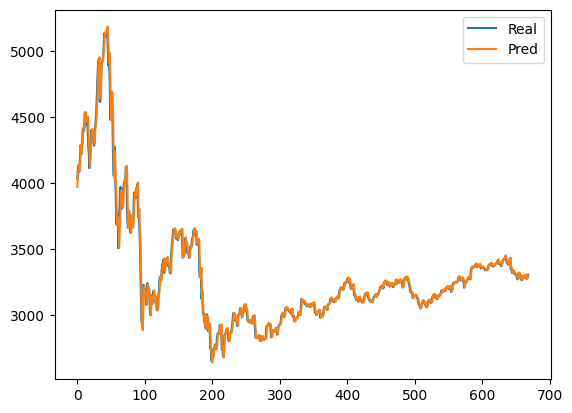

In [ ]:
y_test_signal=min_max_scaler.inverse_transform(test_ds.y.numpy().reshape(-1,1))
y_pred_signal=min_max_scaler.inverse_transform(y_pred.detach().cpu().numpy().reshape(-1,1))
plt.plot(y_test_signal, label="Real")
plt.plot(y_pred_signal, label="Pred")
plt.legend()
attn_mae = mean_absolute_error(y_test_signal, y_pred_signal)
attn_mape = mean_absolute_percentage_error(y_test_signal, y_pred_signal)
attn_rmse = np.sqrt(mean_squared_error(y_test_signal, y_pred_signal))
attn_r2 = r2_score(y_test_signal, y_pred_signal)

print(f"ATTN MAE : {attn_mae}")
print(f"ATTN MAPE : {attn_mape}")
print(f"ATTN RMSE : {attn_rmse}")
print(f"ATTN R2 : {attn_r2}")